In [1]:
import pandas as pd
import numpy as np

def analyze_data(file_path, target_column):
    # Load the data
    data = pd.read_csv(file_path)
    
    # Basic information
    num_rows = data.shape[0]
    num_features = data.shape[1]
    missing_values = data.isnull().sum().sum()
    
    # Analyze features
    feature_analysis = []
    for column in data.columns:
        dtype = data[column].dtype
        missing = data[column].isnull().sum()
        if dtype == 'object' or data[column].nunique() < 20:  # Categorical if object or few unique values
            feature_type = "Categorical"
            values = ', '.join(map(str, data[column].unique()[:5])) + "..." if data[column].nunique() > 5 else ', '.join(map(str, data[column].unique()))
        else:
            feature_type = "Numerical"
            values = f"Range: {data[column].min()} to {data[column].max()}"
            
        # Check for outliers (define as 1.5*IQR beyond Q1/Q3)
        if feature_type == "Numerical":
            q1 = data[column].quantile(0.25)
            q3 = data[column].quantile(0.75)
            iqr = q3 - q1
            outliers = data[(data[column] < (q1 - 1.5 * iqr)) | (data[column] > (q3 + 1.5 * iqr))].shape[0]
        else:
            outliers = "N/A"

        feature_analysis.append({
            "Feature": column,
            "Type": feature_type,
            "Values": values,
            "Missing Values": missing,
            "Outliers": outliers
        })
    
    # Classification or regression analysis
    if target_column in data.columns:
        target_values = data[target_column]
        if target_values.nunique() <= 2:
            target_type = "Classification"
            class_distribution = target_values.value_counts(normalize=True).to_dict()
            target_encoding = f"Classes: {', '.join(map(str, target_values.unique()))}"
        else:
            target_type = "Regression"
            class_distribution = None
            target_encoding = f"Range: {target_values.min()} to {target_values.max()}"
    else:
        target_type = "Unknown"
        class_distribution = "Target column not found"
        target_encoding = "N/A"
    
    # Summary
    summary = {
        "Number of Rows": num_rows,
        "Number of Features": num_features,
        "Total Missing Values": missing_values,
        "Target Type": target_type,
        "Target Encoding/Range": target_encoding,
        "Class Distribution": class_distribution
    }

    # Convert feature analysis to DataFrame for better readability
    feature_analysis_df = pd.DataFrame(feature_analysis)
    
    return summary, feature_analysis_df

# Example usage:
file_path = "train.csv"  # Replace with your dataset file path
target_column = "TARGET"  # Replace with the actual target column name
summary, feature_analysis = analyze_data(file_path, target_column)

# Display results
print("Summary:")
print(summary)
print("\nFeature Analysis:")
print(feature_analysis)

Summary:
{'Number of Rows': 76020, 'Number of Features': 371, 'Total Missing Values': 0, 'Target Type': 'Classification', 'Target Encoding/Range': 'Classes: 0, 1', 'Class Distribution': {0: 0.9604314654038411, 1: 0.0395685345961589}}

Feature Analysis:
                     Feature         Type                         Values  \
0                         ID    Numerical             Range: 1 to 151838   
1                       var3    Numerical          Range: -999999 to 238   
2                      var15    Numerical                Range: 5 to 105   
3         imp_ent_var16_ult1    Numerical         Range: 0.0 to 210000.0   
4    imp_op_var39_comer_ult1    Numerical         Range: 0.0 to 12888.03   
..                       ...          ...                            ...   
366  saldo_medio_var44_hace3    Numerical         Range: 0.0 to 24650.01   
367   saldo_medio_var44_ult1    Numerical         Range: 0.0 to 681462.9   
368   saldo_medio_var44_ult3    Numerical         Range: 0.0 to

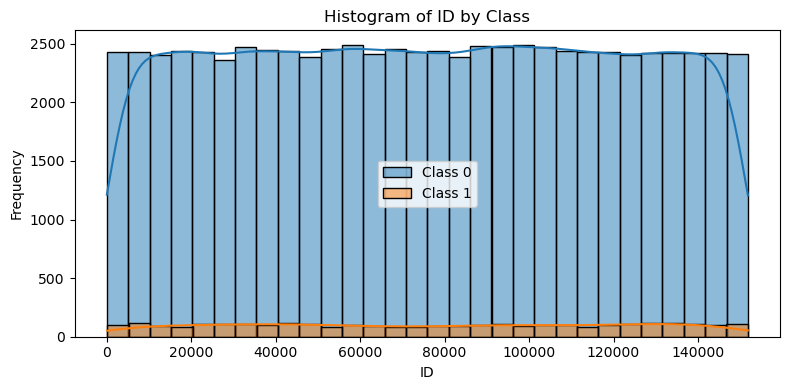

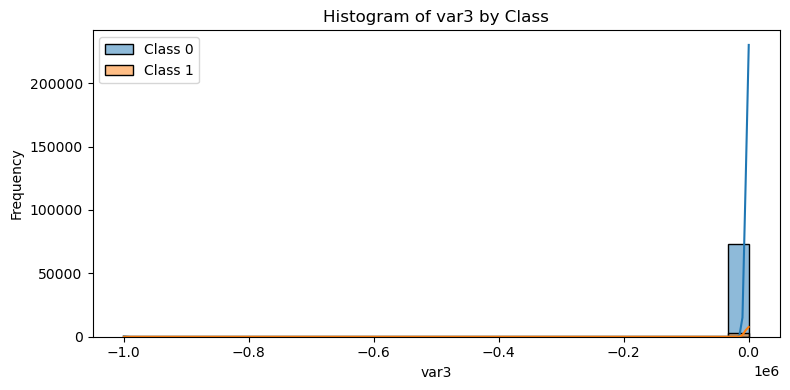

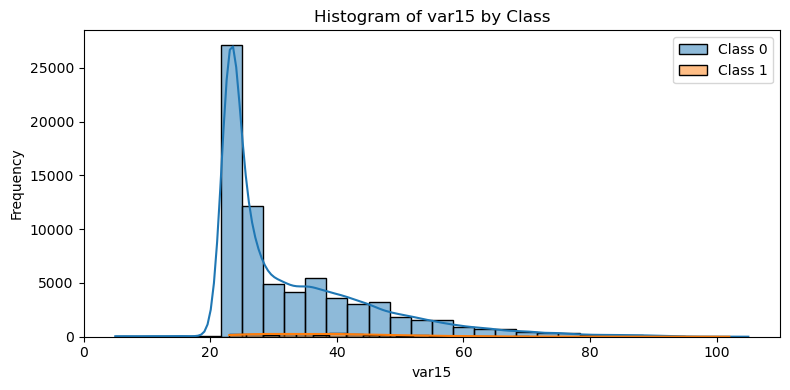

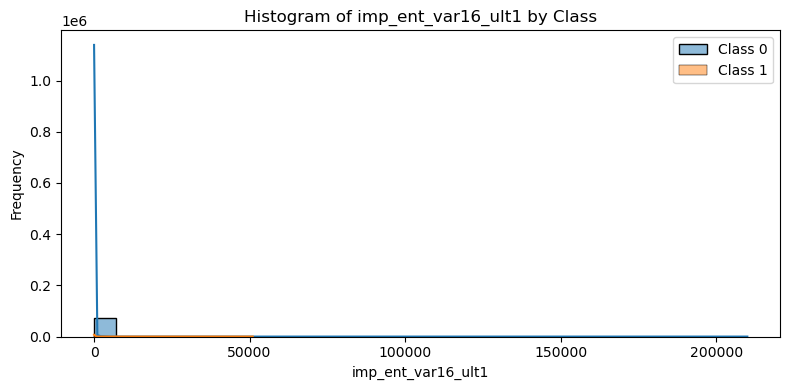

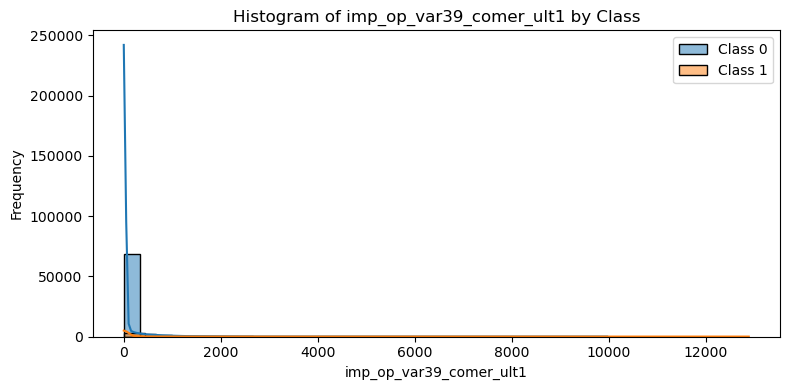

...

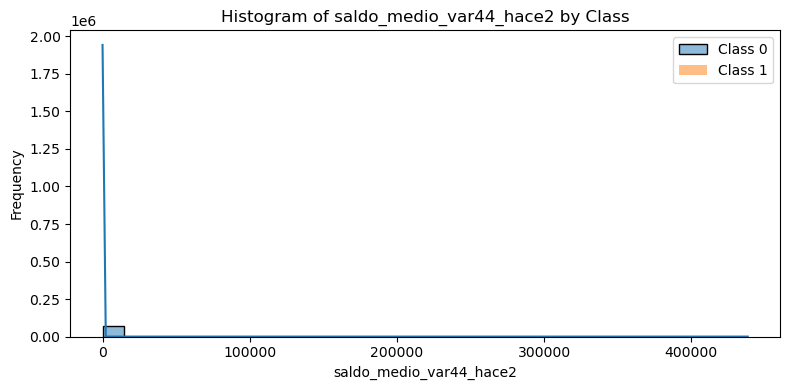

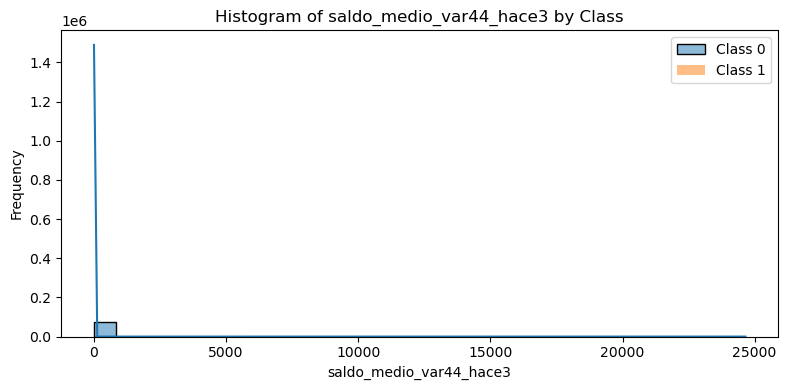

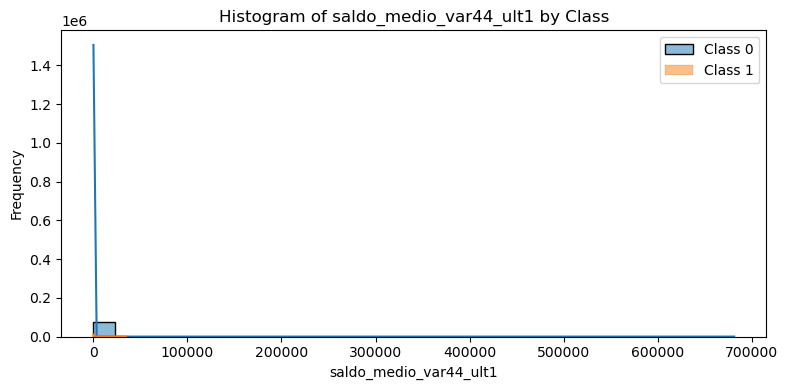

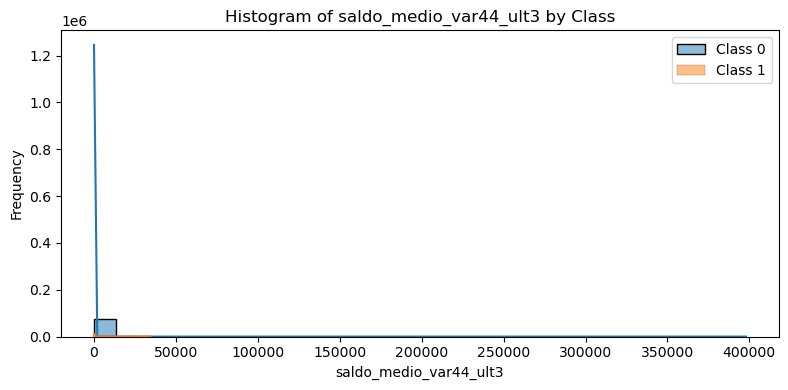

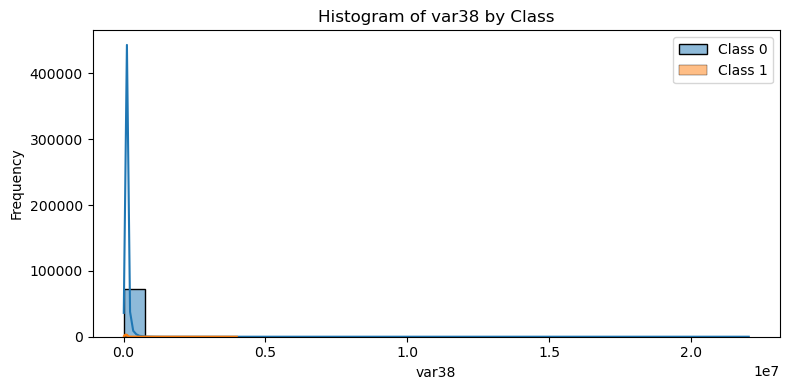

Categorical Features Summary:

Feature: ind_var1_0
TARGET  ind_var1_0
0       0             0.988577
        1             0.011423
1       0             0.987699
        1             0.012301
Name: proportion, dtype: float64

Feature: ind_var1
TARGET  ind_var1
0       0           0.996357
        1           0.003643
1       0           0.993351
        1           0.006649
Name: proportion, dtype: float64

Feature: ind_var2_0
TARGET  ind_var2_0
0       0             1.0
1       0             1.0
Name: proportion, dtype: float64

Feature: ind_var2
TARGET  ind_var2
0       0           1.0
1       0           1.0
Name: proportion, dtype: float64

Feature: ind_var5_0
TARGET  ind_var5_0
0       1             0.959363
        0             0.040637
1       1             0.925532
        0             0.074468
Name: proportion, dtype: float64

Feature: ind_var5
TARGET  ind_var5
0       1           0.676738
        0           0.323262
1       0           0.651263
        1           0.3487

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def visualize_data(data, target_column, classification=True):
    """
    Visualize data for classification or regression tasks.
    
    Parameters:
    - data: DataFrame containing the dataset.
    - target_column: The target column to classify or regress.
    - classification: Set to True for classification tasks, False for regression tasks.
    """
    if classification:
        # For classification tasks
        classes = data[target_column].unique()
        for column in data.columns:
            if column != target_column:
                plt.figure(figsize=(8, 4))
                for cls in classes:
                    sns.histplot(data[data[target_column] == cls][column], kde=True, label=f"Class {cls}", bins=30)
                plt.title(f"Histogram of {column} by Class")
                plt.xlabel(column)
                plt.ylabel("Frequency")
                plt.legend()
                plt.tight_layout()
                plt.show()
    else:
        # For regression tasks
        # Define bins based on the regression target
        bins = [0, 0.25, 0.5, 0.75, 1.0]
        labels = [1, 2, 3, 4]
        data["RegressionClass"] = pd.cut(data[target_column], bins=bins, labels=labels)
        
        classes = data["RegressionClass"].unique()
        for column in data.columns:
            if column != target_column and column != "RegressionClass":
                plt.figure(figsize=(8, 4))
                for cls in classes:
                    sns.histplot(data[data["RegressionClass"] == cls][column], kde=True, label=f"Class {cls}", bins=30)
                plt.title(f"Histogram of {column} by Regression Class")
                plt.xlabel(column)
                plt.ylabel("Frequency")
                plt.legend()
                plt.tight_layout()
                plt.show()

    # Summary for categorical features
    categorical_features = [col for col in data.columns if data[col].dtype == 'object' or data[col].nunique() < 10]
    if categorical_features:
        print("Categorical Features Summary:")
        for feature in categorical_features:
            print(f"\nFeature: {feature}")
            print(data.groupby(target_column)[feature].value_counts(normalize=True))

# Example usage:
file_path = "train.csv"  # Path to your dataset
target_column = "TARGET"  # Replace with actual target column name
data = pd.read_csv(file_path)

visualize_data(data, target_column, classification=True)  # Set classification=False for regression

In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

def data_cleaning_and_preparation(data, categorical_features, numerical_features, scaling_strategy="standard"):
    """
    Perform data cleaning, rescaling, and one-hot encoding for machine learning preparation.

    Parameters:
    - data: DataFrame containing the dataset.
    - categorical_features: List of categorical feature names.
    - numerical_features: List of numerical feature names.
    - scaling_strategy: "standard" or "minmax" for rescaling strategy.

    Returns:
    - cleaned_data: DataFrame with cleaned and processed data.
    """
    # 1. Data Cleaning: Handle missing values
    print("Handling Missing Values...")
    for column in data.columns:
        if data[column].isnull().sum() > 0:
            if column in categorical_features:
                print(f"Filling missing values in categorical feature: {column} with mode.")
                data[column].fillna(data[column].mode()[0], inplace=True)
            elif column in numerical_features:
                print(f"Filling missing values in numerical feature: {column} with median.")
                data[column].fillna(data[column].median(), inplace=True)

    # 2. Rescaling Numerical Features
    if scaling_strategy == "standard":
        scaler = StandardScaler()
    elif scaling_strategy == "minmax":
        scaler = MinMaxScaler()
    else:
        raise ValueError("Scaling strategy must be 'standard' or 'minmax'.")

    print("Rescaling Numerical Features...")
    numerical_data = pd.DataFrame(scaler.fit_transform(data[numerical_features]),
                                  columns=numerical_features)

    # Visualize features before and after rescaling
    for feature in numerical_features:
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        sns.histplot(data[feature], kde=True)
        plt.title(f"Original {feature}")

        plt.subplot(1, 2, 2)
        sns.histplot(numerical_data[feature], kde=True)
        plt.title(f"Rescaled {feature}")
        plt.tight_layout()
        plt.show()

    # 3. One-hot Encoding Categorical Features
    print("One-hot Encoding Categorical Features...")
    encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
    encoded_data = pd.DataFrame(encoder.fit_transform(data[categorical_features]),
                                columns=encoder.get_feature_names_out(categorical_features))

    # 4. Combine Cleaned Data
    cleaned_data = pd.concat([numerical_data, encoded_data], axis=1)

    print("Data cleaning and preparation complete.")
    return cleaned_data

# Example usage:
file_path = "train.csv"  # Replace with your dataset file path
data = pd.read_csv(file_path)
categorical_features = ["cat_feature1", "cat_feature2"]  # Replace with actual categorical feature names
numerical_features = ["num_feature1", "num_feature2"]  # Replace with actual numerical feature names

cleaned_data = data_cleaning_and_preparation(data, categorical_features, numerical_features, scaling_strategy="standard")


Handling Missing Values...
Rescaling Numerical Features...


KeyError: "None of [Index(['num_feature1', 'num_feature2'], dtype='object')] are in the [columns]"